In [1]:
import pathlib
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import cv2
import numpy as np
import pandas as pd
from collections import deque
from copy import deepcopy

In [2]:
# BODY_25 Output Format
keypointsMapping = {
    0: 'Nose',
    1: 'Neck',
    2: 'RShoulder',
    3: 'RElbow',
    4: 'RWrist',
    5: 'LShoulder',
    6: 'LElbow',
    7: 'LWrist',
    8: 'MidHip',
    9: 'RHip',
    10: 'RKnee',
    11: 'RAnkle',
    12: 'LHip',
    13: 'LKnee',
    14: 'LAnkle',
    15: 'REye',
    16: 'LEye',
    17: 'REar',
    18: 'LEar',
    19: "LBigToe",
    20: "LSmallToe",
    21: "LHeel",
    22: "RBigToe",
    23: "RSmallToe",
    24: "RHeel",
    25: "Background"
}

# データフレームの読み込み

In [3]:
# path
root_dir = pathlib.Path("../../data/fashion550k").resolve()
original_csv_path = root_dir / "dataframe.csv"
s0_csv_path = pathlib.Path("./selection0/select_df.csv")
save_dir = pathlib.Path("selection1-Kai")
if not save_dir.exists():
    save_dir.mkdir()
# データ選択０で指定されたデータフレーム
df = pd.read_csv(s0_csv_path)
print("データ数:", len(df))
df.head()

データ数: 391798


,img_path,keypoint_path,visualized_path
0,/home/yohei/Documents/tlab/data/fashion550k/ph...,/home/yohei/Documents/tlab/data/fashion550k/an...,/home/yohei/Documents/tlab/data/fashion550k/an...
1,/home/yohei/Documents/tlab/data/fashion550k/ph...,/home/yohei/Documents/tlab/data/fashion550k/an...,/home/yohei/Documents/tlab/data/fashion550k/an...
2,/home/yohei/Documents/tlab/data/fashion550k/ph...,/home/yohei/Documents/tlab/data/fashion550k/an...,/home/yohei/Documents/tlab/data/fashion550k/an...
3,/home/yohei/Documents/tlab/data/fashion550k/ph...,/home/yohei/Documents/tlab/data/fashion550k/an...,/home/yohei/Documents/tlab/data/fashion550k/an...
4,/home/yohei/Documents/tlab/data/fashion550k/ph...,/home/yohei/Documents/tlab/data/fashion550k/an...,/home/yohei/Documents/tlab/data/fashion550k/an...


# データ選択1-Kai

- 対象：データ選択０で選んだ391,798枚に対して以下の基準でデータ選択．

- 閾値：
    - 閾値1: 0.1，0.2， 0.3, 0.4, 0.5 の６通り．
    - 閾値2: 0.0， 0.1，0.2， 0.3, 0.4 

閾値2 は手足の先に用います．

例）閾値１が 0.3 の時，閾値２を0 ~ 0.2 まで変化させる．

- 基準： 以下の２つをともに満たすかどうか
    - 基準１： 鼻 [0] と 胴体 [1, 2, 5, 8, 9, 12] と 肘・膝 [3,  6, 10, 13]の全ての確信度が閾値1 より大きい
    - 基準２： 手首・足首 [4, 7, 11, 14] の 全ての確信度が閾値2 より大きい

In [4]:
# 注目する位置
attention1 = [0, 1, 2, 3, 5, 6, 8, 9, 10, 12, 13]
attention2 = [4, 7, 11, 14]
# 閾値
threshold1 = [0.1, 0.2, 0.3, 0.4, 0.5]
threshold2 = [0.0, 0.1, 0.2, 0.3, 0.4]
for a in attention1:
    print(keypointsMapping[a], end=", ")
print()
for a in attention2:
    print(keypointsMapping[a], end=", ")
print()

Nose, Neck, RShoulder, RElbow, LShoulder, LElbow, MidHip, RHip, RKnee, LHip, LKnee, 
RWrist, LWrist, RAnkle, LAnkle, 


# 閾値１が0.1の場合

## 基準１を満たすデータを集める

In [5]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold1[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention1,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(df)

True

In [6]:
# 基準にあったもの
s_df = df[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i

hoge = pd.Series(map(not4index, index))
d_df = df[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {:,} | 基準を満たさなかったデータ数 : {:,}".format(
    len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 343,822 | 基準を満たさなかったデータ数 : 47,976


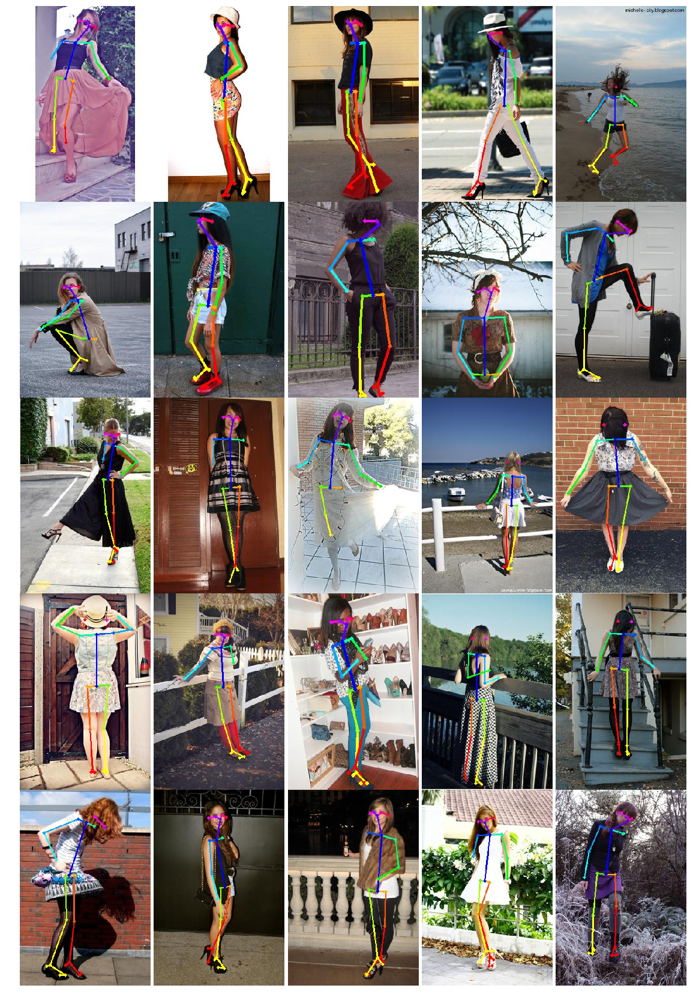

In [7]:
# 基準を満たさなかったデータを可視化
fig, axes = plt.subplots(5, 5, figsize=(20, 30))
for (i, (_, _, visualized_path)), ax in zip(d_df.iterrows(), axes.flatten()):
    img = cv2.cvtColor(cv2.imread(str(visualized_path)), cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_axis_off()
plt.subplots_adjust(hspace=0, wspace=0)
# fig.savefig(save_dir / "example.png", bbox_inches='tight', pad_inches=0)

## 基準２を満たすデータをみる
### 閾値２が0 の場合

In [8]:
threshold = threshold1[0]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

343822

In [9]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [10]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection01-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation01-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 328831 | 基準を満たさなかったデータ数 : 14991


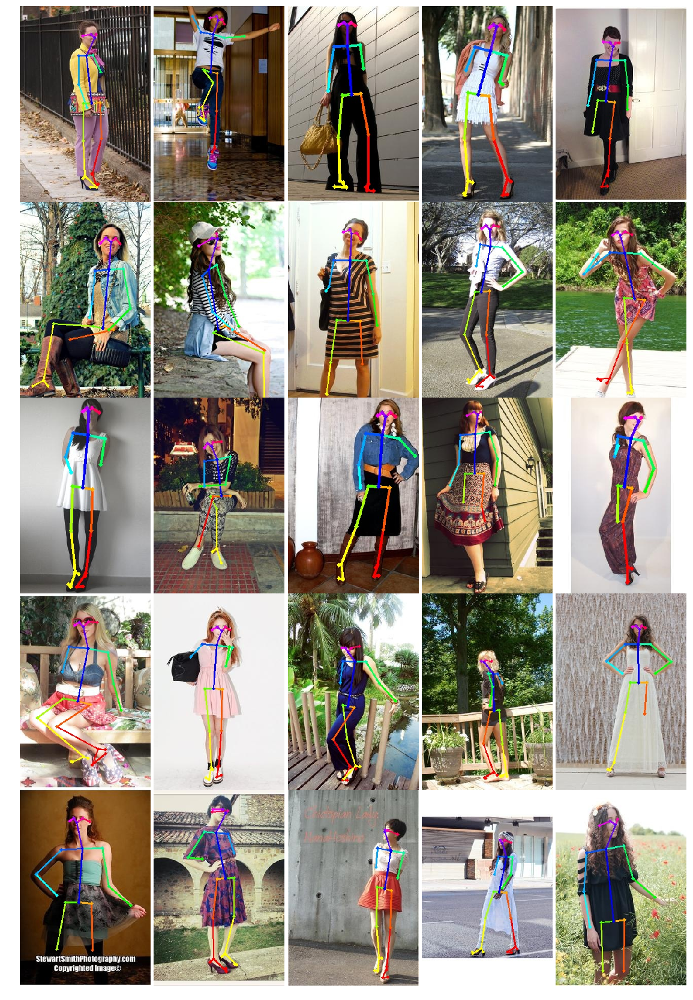

In [11]:
# 基準を満たさなかったデータを可視化
fig, axes = plt.subplots(5, 5, figsize=(20, 30))
for (i, (_, _, visualized_path)), ax in zip(d_df.iterrows(), axes.flatten()):
    img = cv2.cvtColor(cv2.imread(str(visualized_path)), cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_axis_off()
plt.subplots_adjust(hspace=0, wspace=0)
# fig.savefig(save_dir / "example.png", bbox_inches='tight', pad_inches=0)

# 閾値１が0.2 の場合

## 基準１を満たすデータを集める

In [12]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold1[1] # 閾値
for i, (_, keypoints_path, _) in tqdm(df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention1,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(df)

True

In [13]:
# 基準にあったもの
s_df = df[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i

hoge = pd.Series(map(not4index, index))
d_df = df[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {:,} | 基準を満たさなかったデータ数 : {:,}".format(
    len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 319,023 | 基準を満たさなかったデータ数 : 72,775


## 基準２を満たすデータを集める

### 閾値２が0の場合

In [14]:
threshold = threshold1[1]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

319023

In [15]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [16]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection02-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation02-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 311928 | 基準を満たさなかったデータ数 : 7095


### 閾値2が0.1の場合

In [17]:
threshold = threshold1[1]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

319023

In [18]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[1] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [19]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection02-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation02-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 304131 | 基準を満たさなかったデータ数 : 14892


# 閾値1が0.3の場合
## 基準１を満たすデータを集める

In [20]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold1[2] # 閾値
print("閾値1: ", threshold)
for i, (_, keypoints_path, _) in tqdm(df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention1,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(df)

閾値1:  0.3


True

In [21]:
# 基準にあったもの
s_df = df[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i

hoge = pd.Series(map(not4index, index))
d_df = df[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {:,} | 基準を満たさなかったデータ数 : {:,}".format(
    len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 296,043 | 基準を満たさなかったデータ数 : 95,755


## 基準２を満たすデータを集める
### 閾値2が 0 の場合

In [22]:
threshold = threshold1[2]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

296043

In [23]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [24]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 291829 | 基準を満たさなかったデータ数 : 4214


### 閾値２が0.1 の場合

In [25]:
threshold = threshold1[2]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

296043

In [26]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[1] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [27]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 287633 | 基準を満たさなかったデータ数 : 8410


### 閾値2が0.2の場合

In [28]:
threshold = threshold1[2]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

296043

In [29]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[2] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [30]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation03-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 274787 | 基準を満たさなかったデータ数 : 21256


# 閾値１が0.4の場合
## 基準１を満たすデータを集める

In [31]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold1[3] # 閾値
print("閾値1: ", threshold)
for i, (_, keypoints_path, _) in tqdm(df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention1,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(df)

閾値1:  0.4


True

In [32]:
# 基準にあったもの
s_df = df[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i

hoge = pd.Series(map(not4index, index))
d_df = df[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {:,} | 基準を満たさなかったデータ数 : {:,}".format(
    len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 271,635 | 基準を満たさなかったデータ数 : 120,163


## 基準２を満たすデータを集める
### 閾値2が0.0 の場合

In [33]:
threshold = threshold1[3]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

271635

In [34]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [35]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 269065 | 基準を満たさなかったデータ数 : 2570


### 閾値2が0.1 の場合

In [36]:
threshold = threshold1[3]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

271635

In [37]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[1] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [38]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 266717 | 基準を満たさなかったデータ数 : 4918


### 閾値2が0.2の場合

In [39]:
threshold = threshold1[3]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

271635

In [40]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[2] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [41]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 259453 | 基準を満たさなかったデータ数 : 12182


### 閾値2が0.3の場合

In [42]:
threshold = threshold1[3]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

271635

In [43]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[3] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [44]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation04-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 246951 | 基準を満たさなかったデータ数 : 24684


# 閾値１が0.5の場合
## 基準１を満たすデータを集める

In [45]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold1[4] # 閾値
print("閾値1: ", threshold)
for i, (_, keypoints_path, _) in tqdm(df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention1,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(df)

閾値1:  0.5


True

In [46]:
# 基準にあったもの
s_df = df[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i

hoge = pd.Series(map(not4index, index))
d_df = df[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {:,} | 基準を満たさなかったデータ数 : {:,}".format(
    len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 236,104 | 基準を満たさなかったデータ数 : 155,694


## 基準２を満たすデータを集める
### 閾値2が0.0の場合

In [47]:
threshold = threshold1[4]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

236104

In [48]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[0] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [49]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 234884 | 基準を満たさなかったデータ数 : 1220


### 閾値2が0.1の場合 

In [50]:
threshold = threshold1[4]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

236104

In [51]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[1] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [52]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 233757 | 基準を満たさなかったデータ数 : 2347


### 閾値2が0.2の場合

In [53]:
threshold = threshold1[4]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

236104

In [54]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[2] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [55]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 230221 | 基準を満たさなかったデータ数 : 5883


### 閾値2が0.3の場合

In [56]:
threshold = threshold1[4]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

236104

In [57]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[3] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [58]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 223564 | 基準を満たさなかったデータ数 : 12540


### 閾値2が0.4の場合 

In [59]:
threshold = threshold1[4]
s_df = pd.read_csv(
    save_dir / "selection{}_df.csv".format(str(threshold).replace(".", "")))
len(s_df)

236104

In [60]:
# 全画像でやってみる
index = deque(maxlen=len(df)+100)
threshold = threshold2[4] # 閾値
for i, (_, keypoints_path, _) in tqdm(s_df.iterrows()):
    keypoints = np.load(keypoints_path)
    judge = np.all(keypoints[:,attention2,2] > threshold)
    if judge:
        index.append(True)
    else:
        index.append(False)

len(index) == len(s_df)

True

In [61]:
# 基準にあったもの
s_df_pre = deepcopy(s_df)
s_df = s_df_pre[pd.Series(index)].reset_index(drop=True)

# 基準にあってないもの
def not4index(i):
    return not i
hoge = pd.Series(map(not4index, index))
d_df = s_df_pre[hoge].reset_index(drop=True)

print("基準を満たしたデータ数 ： {} | 基準を満たさなかったデータ数 : {}".format(len(s_df), len(d_df)))

# 保存
s_df.to_csv(save_dir /
            "selection05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)
d_df.to_csv(save_dir /
            "deprecation05-{}_df.csv".format(str(threshold).replace(".", "")),
            index=False)

基準を満たしたデータ数 ： 211080 | 基準を満たさなかったデータ数 : 25024


# データ数の棒グラフ

## データ

In [62]:
datalength = []
threshold = threshold1[0]
dir_path = pathlib.Path("selection1-Kai/")

In [63]:
dir_path.glob("selection{}-{}_df.csv")

<generator object Path.glob at 0x7f3535c816d8>

In [64]:
threshold1

[0.1, 0.2, 0.3, 0.4, 0.5]

In [65]:
threshold2[:1]

[0.0]

In [66]:
str(0.1)[-1]

'1'

In [68]:
datalength = []
for i in threshold1:
    i = int(str(i)[-1])
    tmp = []
    for j in threshold2[:i]:
        path = pathlib.Path("selection0{}-{}_df.csv".format(
            i,
            str(j).replace(".", "")))
        path = save_dir / path
        assert path.exists(), "{}".format(path)
        tmp.append(len(pd.read_csv(path)))
    
    datalength.append(tmp)

In [80]:
tmp = [315081, 284090, 256692, 228266, 188946]  # データ選択１より
for i in range(len(tmp)):
    datalength[i].append(tmp[i])
datalength

[[328831, 315081],
 [311928, 304131, 284090],
 [291829, 287633, 274787, 256692],
 [269065, 266717, 259453, 246951, 228266],
 [234884, 233757, 230221, 223564, 211080, 188946]]

## 閾値１が0.1

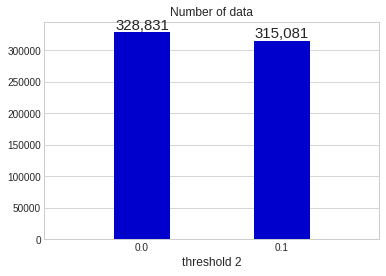

In [105]:
plt.style.use("seaborn-whitegrid")
thresholds = threshold2[:2]
x = list(range(len(thresholds)))
plt.title("Number of data")
plt.xlim(-0.7,1.7)
plt.bar(x, datalength[0], color="mediumblue", width=0.4, align="center")
plt.grid(axis="x")

# 棒グラフ内に数値を書く
for x_, y_ in zip(x, datalength[0]):
    plt.text(x_, y_, "{:,}".format(y_), ha='center', va='bottom', fontdict={"fontsize":15})
plt.xlabel("threshold 2", fontdict={"fontsize":12})
_ = plt.xticks(x, thresholds)
plt.savefig(save_dir / "selection1-Kai-01_bar.png")

## 閾値１が0.2

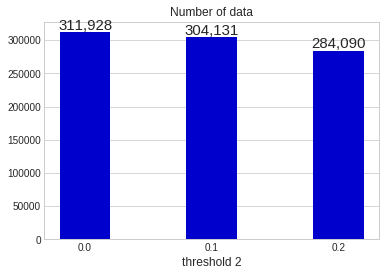

In [108]:
plt.style.use("seaborn-whitegrid")
thresholds = threshold2[:3]
x = list(range(len(thresholds)))
plt.title("Number of data")
# plt.xlim(-0.7,1.7)
plt.bar(x, datalength[1], color="mediumblue", width=0.4, align="center")
plt.grid(axis="x")

# 棒グラフ内に数値を書く
for x_, y_ in zip(x, datalength[1]):
    plt.text(x_, y_, "{:,}".format(y_), ha='center', va='bottom', fontdict={"fontsize":15})
plt.xlabel("threshold 2", fontdict={"fontsize":12})
_ = plt.xticks(x, thresholds)
plt.savefig(save_dir / "selection1-Kai-02_bar.png")

## 閾値１が0.3

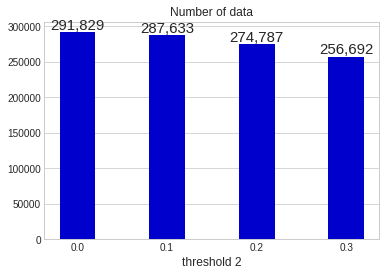

In [109]:
plt.style.use("seaborn-whitegrid")
thresholds = threshold2[:4]
x = list(range(len(thresholds)))
plt.title("Number of data")
# plt.xlim(-0.7,1.7)
plt.bar(x, datalength[2], color="mediumblue", width=0.4, align="center")
plt.grid(axis="x")

# 棒グラフ内に数値を書く
for x_, y_ in zip(x, datalength[2]):
    plt.text(x_, y_, "{:,}".format(y_), ha='center', va='bottom', fontdict={"fontsize":15})
plt.xlabel("threshold 2", fontdict={"fontsize":12})
_ = plt.xticks(x, thresholds)
plt.savefig(save_dir / "selection1-Kai-03_bar.png")

## 閾値１が0.4

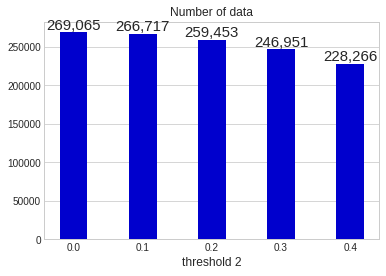

In [118]:
plt.style.use("seaborn-whitegrid")
thresholds = threshold2[:5]
x = list(range(len(thresholds)))
plt.title("Number of data")
# plt.xlim(-0.7,1.7)
plt.bar(x, datalength[3], color="mediumblue", width=0.4, align="center")
plt.grid(axis="x")

# 棒グラフ内に数値を書く
for x_, y_ in zip(x, datalength[3]):
    plt.text(x_, y_, "{:,}".format(y_), ha='center', va='bottom', fontdict={"fontsize":15})
plt.xlabel("threshold 2", fontdict={"fontsize":12})
_ = plt.xticks(x, thresholds)
plt.savefig(save_dir / "selection1-Kai-04_bar.png")

## 閾値１が0.5

In [114]:
threshold2

[0.0, 0.1, 0.2, 0.3, 0.4]

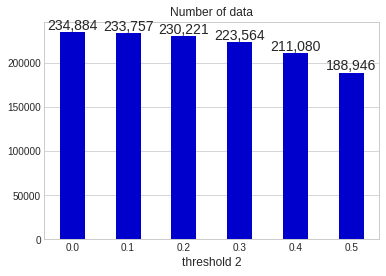

In [119]:
plt.style.use("seaborn-whitegrid")
thresholds = threshold2 + [0.5]
x = list(range(len(thresholds)))
plt.title("Number of data")
# plt.xlim(-0.7,1.7)
plt.bar(x, datalength[4], color="mediumblue", width=0.45, align="center")
plt.grid(axis="x")

# 棒グラフ内に数値を書く
for x_, y_ in zip(x, datalength[4]):
    plt.text(x_, y_, "{:,}".format(y_), ha='center', va='bottom', fontdict={"fontsize":14})
plt.xlabel("threshold 2", fontdict={"fontsize":12})
_ = plt.xticks(x, thresholds)
plt.savefig(save_dir / "selection1-Kai-05_bar.png")

# データを可視化

閾値１が0.5 で閾値2が0.4 で基準を満たし，閾値１が0.5 で閾値2が0.5で基準を満たさなかったデータ 22134枚の一部を可視化

In [123]:
num = 211080-188946
s1_df = pd.read_csv(save_dir / "selection05-04_df.csv")
s2_df = pd.read_csv("selection1/selection05_df.csv")

In [126]:
num == len(s1_df) - len(s2_df)

True

In [127]:
len(s2_df), len(s1_df)

(188946, 211080)

In [147]:
hoge = set(s2_df.loc[:, "visualized_path"])
fuga = set(s1_df.loc[:, "visualized_path"])
img_path = fuga - hoge
len(img_path) == num

True

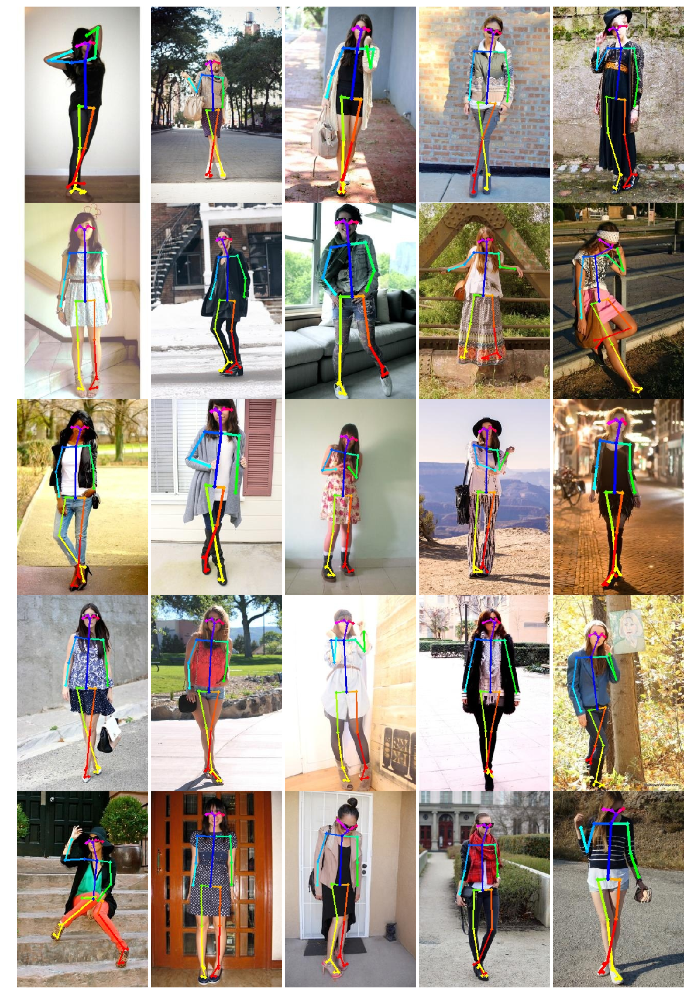

In [150]:
fig, axes = plt.subplots(5, 5, figsize=(20, 30))
for path, ax in zip(img_path, axes.flatten()):
    img = cv2.cvtColor(cv2.imread(str(path)), cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    ax.set_axis_off()
plt.subplots_adjust(hspace=0, wspace=0)
fig.savefig(save_dir / "example05-04~05.png", bbox_inches='tight', pad_inches=0)